In [8]:
import zipfile
import xml.etree.ElementTree as ET
import pandas as pd

def read_xlsx_no_dependencies(path):
    """
    Read an .xlsx file using only Python stdlib (zipfile + xml).
    Returns a pandas DataFrame.
    """

    with zipfile.ZipFile(path) as z:
        # Read shared strings (strings stored once)
        shared_strings = []
        if 'xl/sharedStrings.xml' in z.namelist():
            xml = z.read('xl/sharedStrings.xml')
            root = ET.fromstring(xml)
            for si in root.findall('.//{http://schemas.openxmlformats.org/spreadsheetml/2006/main}t'):
                shared_strings.append(si.text)

        # Read worksheet data (first sheet)
        xml = z.read('xl/worksheets/sheet1.xml')
        root = ET.fromstring(xml)

        rows = []
        for row in root.findall('.//{http://schemas.openxmlformats.org/spreadsheetml/2006/main}row'):
            values = []
            for c in row.findall('{http://schemas.openxmlformats.org/spreadsheetml/2006/main}c'):
                v = c.find('{http://schemas.openxmlformats.org/spreadsheetml/2006/main}v')
                if v is None:
                    values.append(None)
                    continue
                val = v.text

                # If cell type = "s" → shared string index
                if c.get('t') == 's':
                    val = shared_strings[int(val)]
                values.append(val)
            rows.append(values)

    # Convert to DataFrame and use first row as header
    df = pd.DataFrame(rows)
    df.columns = df.iloc[0]
    df = df[1:]  # drop header row
    return df.reset_index(drop=True)


In [9]:
# make master sheet 

from pathlib import Path
import pandas as pd

BASE = Path("/quobyte/lasallegrp/Ensi/project/nhip_macaque/fromBen_MacaqueObese_cfDna/DMRs")

master_rows = []

for folder in BASE.iterdir():
    if not folder.is_dir() or "_" not in folder.name:
        continue

    region, comparison = folder.name.split("_", 1)
    info_path = folder / "sample_info.xlsx"

    if not info_path.exists():
        print(f"⚠️ No sample_info.xlsx in {folder.name}")
        continue

    df = read_xlsx_no_dependencies(info_path)   # ← PURE PYTHON XLSX READER

    df["Region"] = region
    df["Comparison"] = comparison
    df["Folder"] = folder.name

    master_rows.append(df)

if master_rows:
    master_meta = pd.concat(master_rows, ignore_index=True)
    out_csv = BASE / "master_sample_info_cfDNA.csv"
    master_meta.to_csv(out_csv, index=False)
    print("✅ Saved:", out_csv)
else:
    print("❌ No metadata files found.")



⚠️ No sample_info.xlsx in Ensembl_Update
⚠️ No sample_info.xlsx in cytosine_reports_merged
✅ Saved: /quobyte/lasallegrp/Ensi/project/nhip_macaque/fromBen_MacaqueObese_cfDna/DMRs/master_sample_info_cfDNA.csv



=== GD120_OvC: Control (blue) vs Obese (red) ===


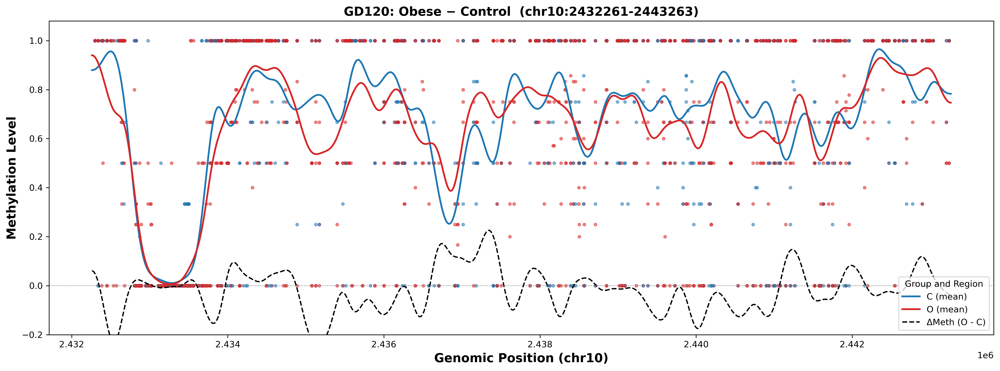


=== GD120_PvC: Control (blue) vs Pravastatin (red) ===


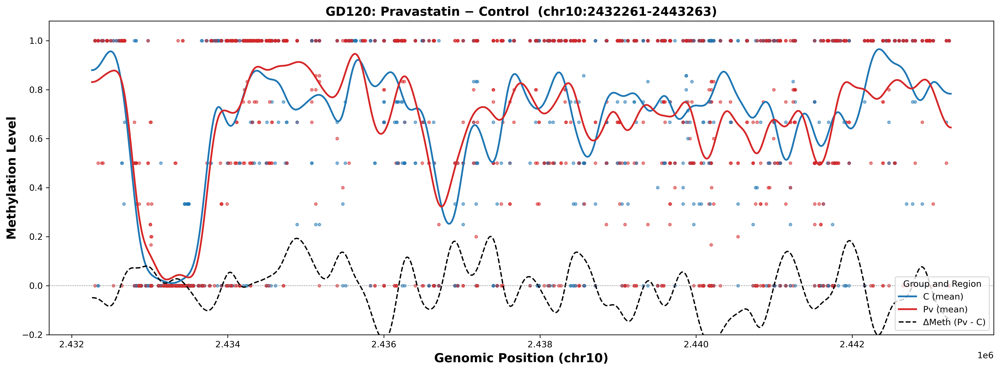


=== GD120_PvO: Pravastatin (blue) vs Obese (red) ===


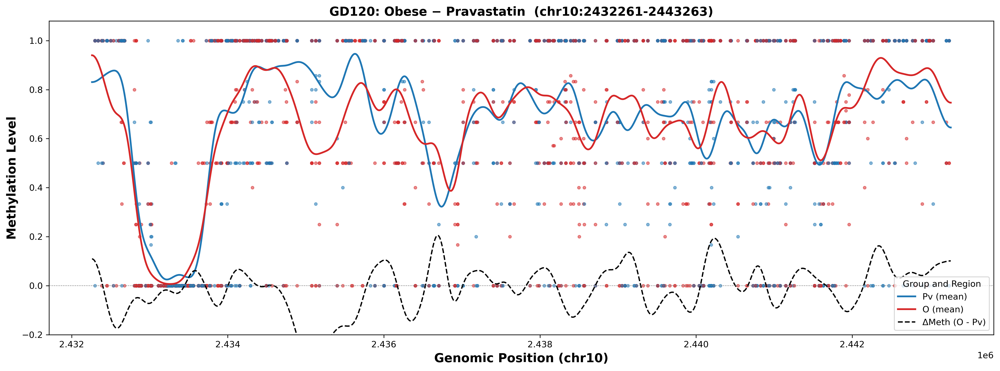


=== GD120_RvC: Control (blue) vs Restriction (red) ===


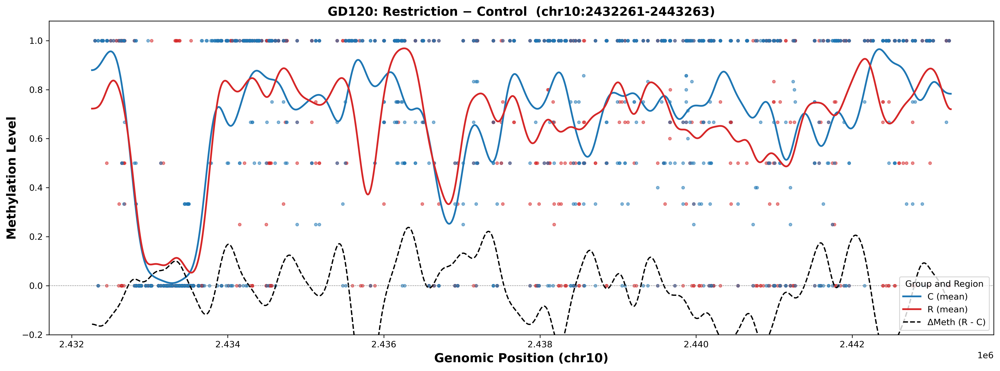


=== GD120_RvO: Restriction (blue) vs Obese (red) ===


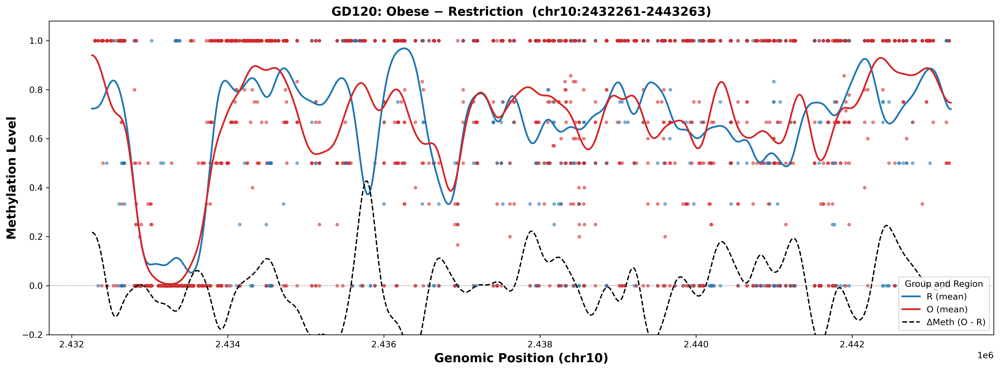


=== GD150_OvC: Control (blue) vs Obese (red) ===


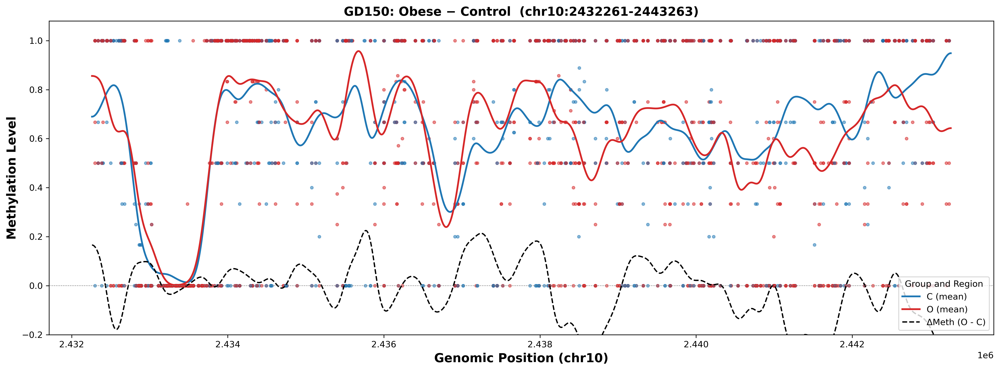


=== GD150_PvC: Control (blue) vs Pravastatin (red) ===


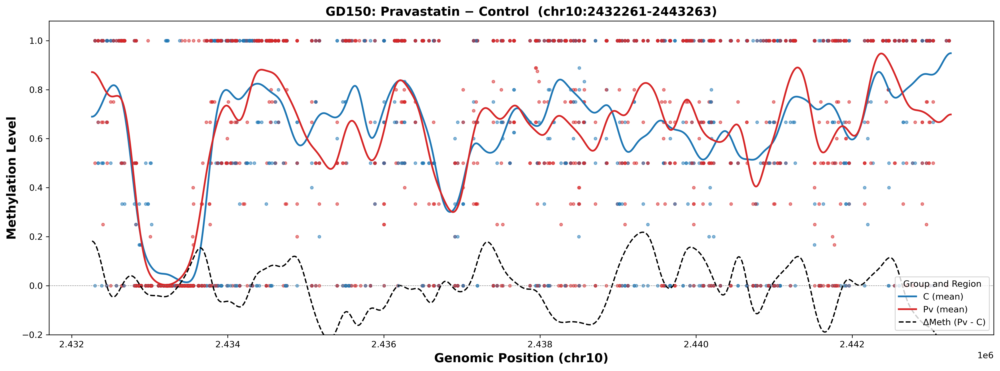


=== GD150_PvO: Pravastatin (blue) vs Obese (red) ===


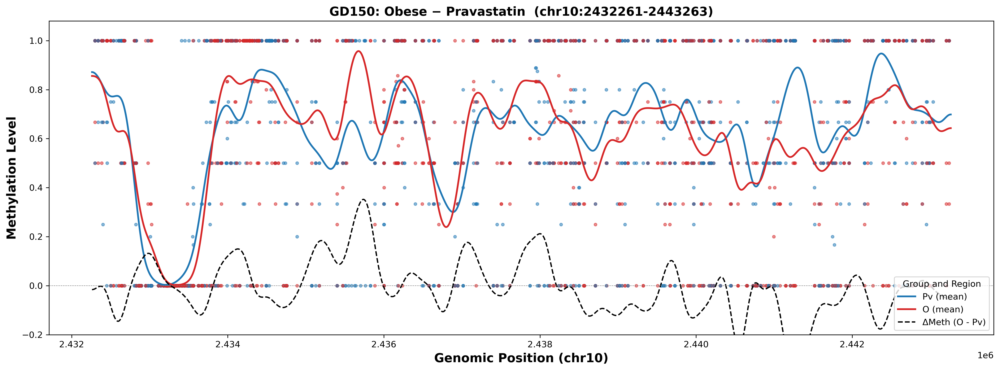


=== GD150_RvC: Control (blue) vs Restriction (red) ===


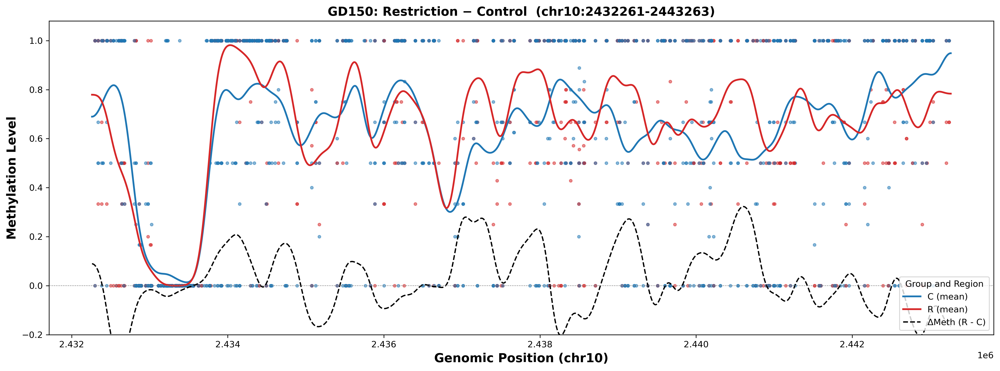


=== GD150_RvO: Restriction (blue) vs Obese (red) ===


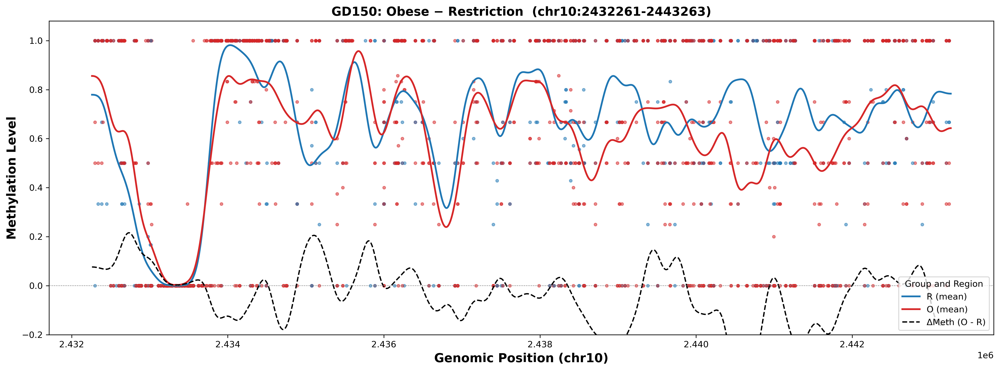


=== GD45_OvC: Control (blue) vs Obese (red) ===


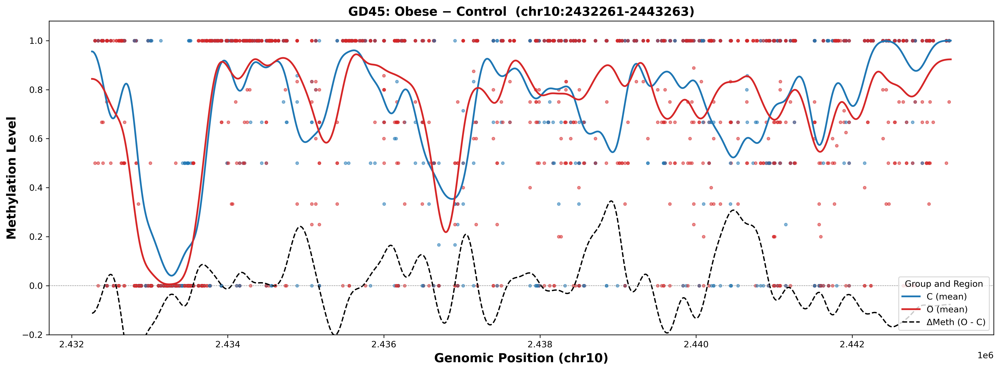


=== GD45_PvC: Control (blue) vs Pravastatin (red) ===


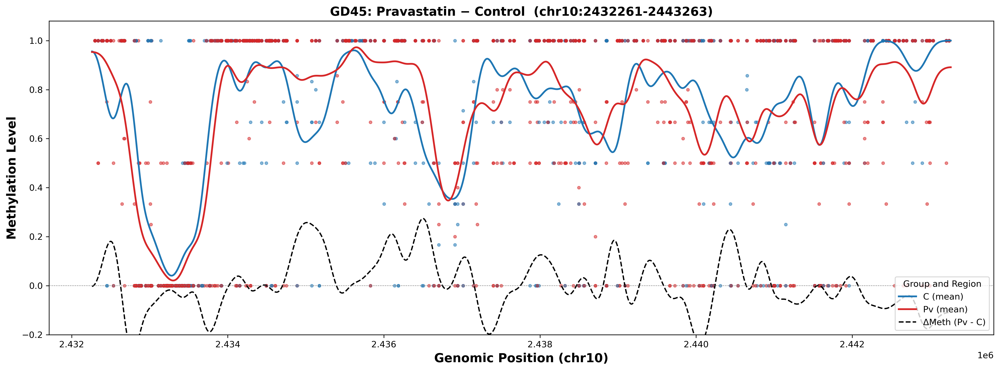


=== GD45_PvO: Pravastatin (blue) vs Obese (red) ===


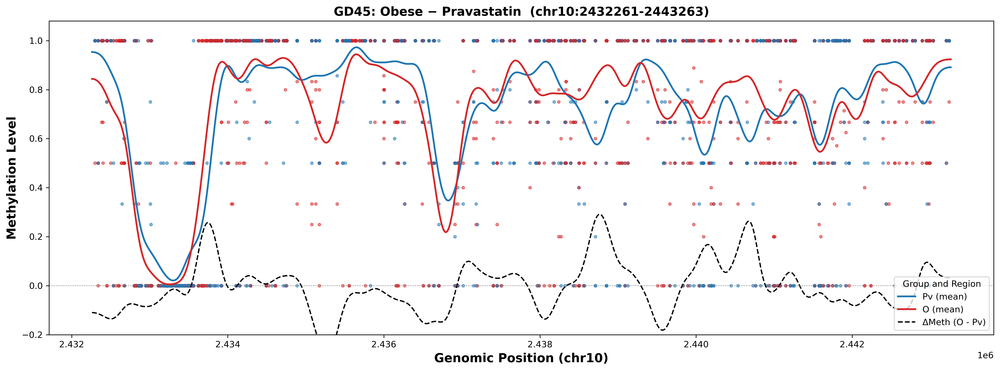


=== GD45_RvC: Control (blue) vs Restriction (red) ===


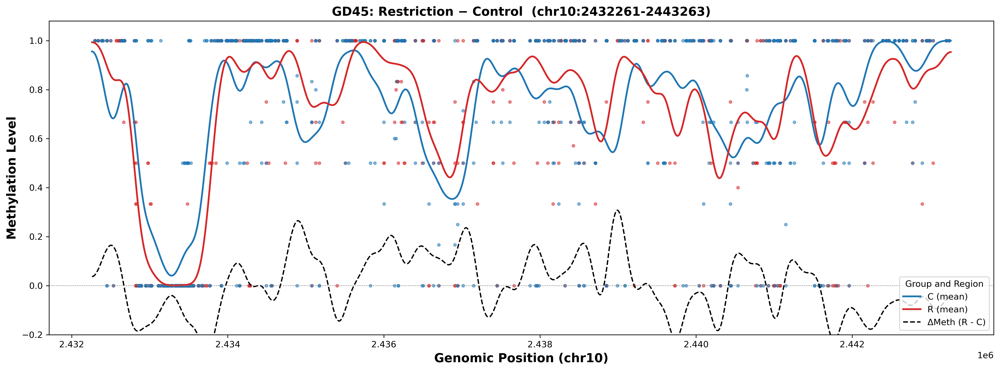


=== GD45_RvO: Restriction (blue) vs Obese (red) ===


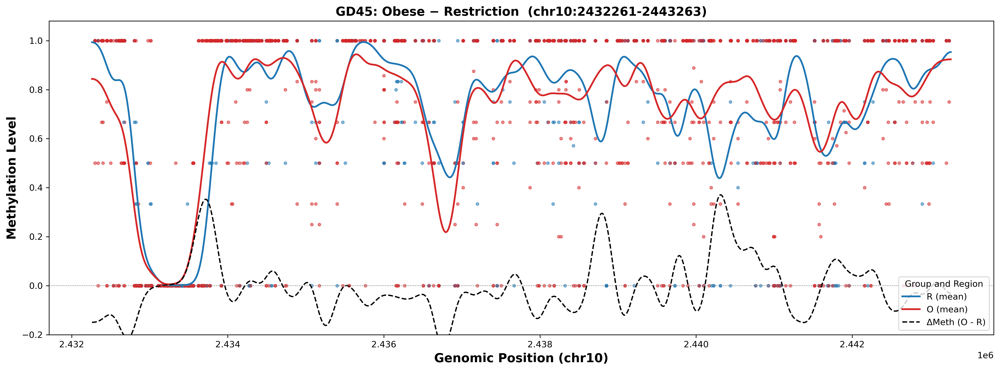


=== GD90_OvC: Control (blue) vs Obese (red) ===


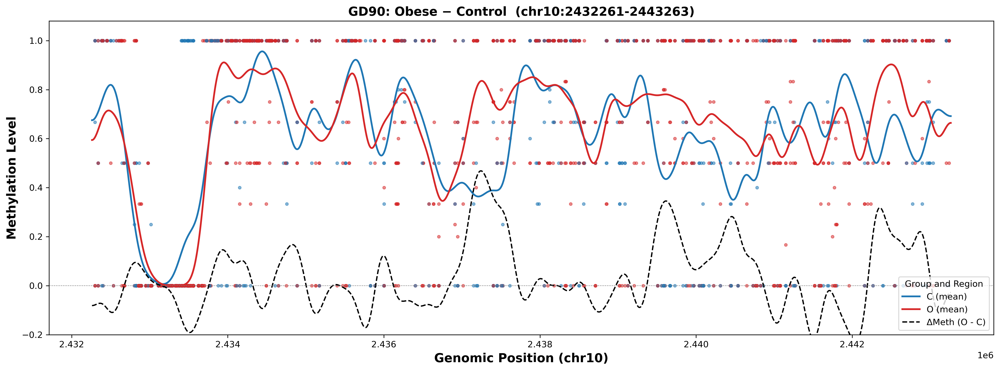


=== GD90_PvC: Control (blue) vs Pravastatin (red) ===


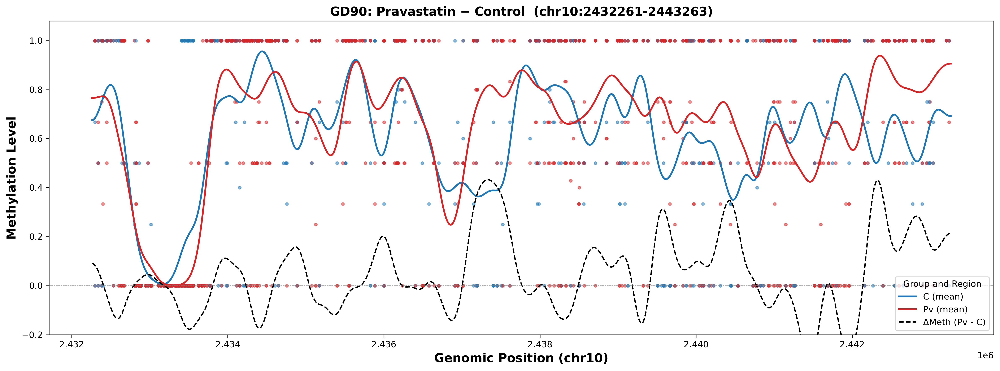


=== GD90_PvO: Pravastatin (blue) vs Obese (red) ===


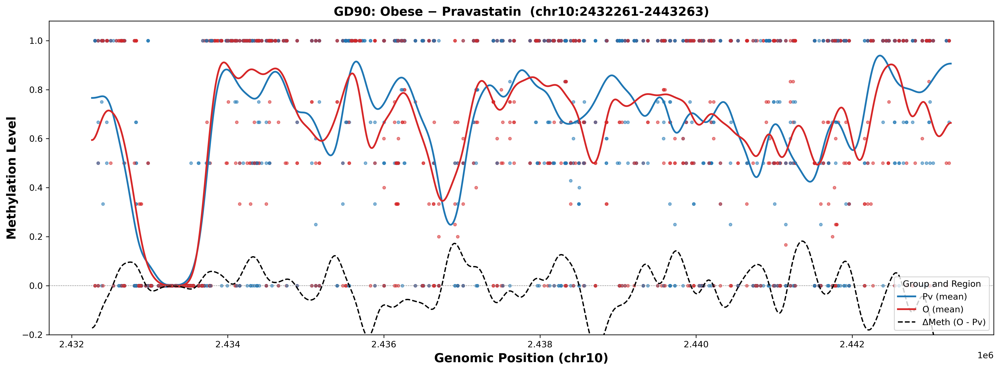


=== GD90_RvC: Control (blue) vs Restriction (red) ===


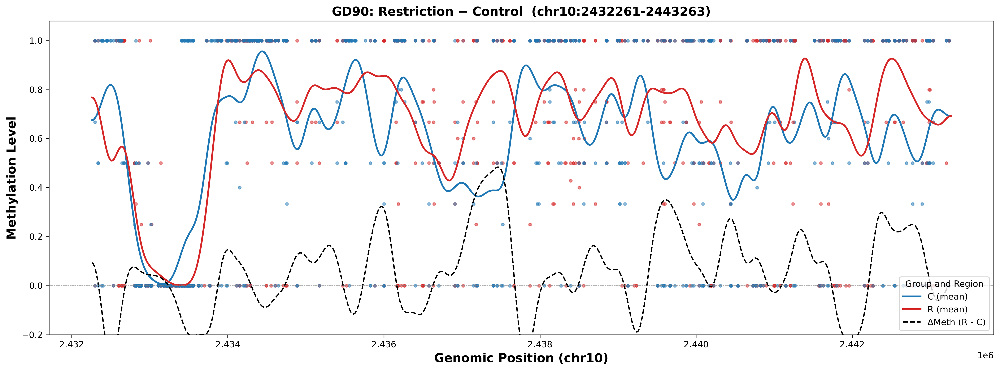


=== GD90_RvO: Restriction (blue) vs Obese (red) ===


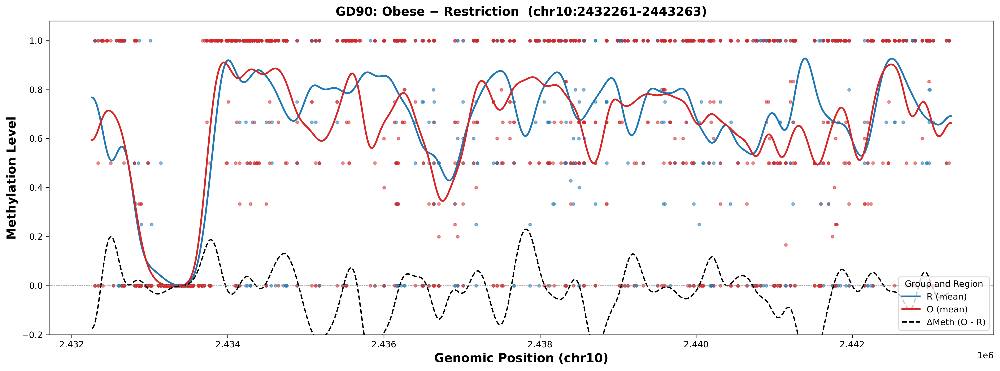


Saved summary table to: /quobyte/lasallegrp/Ensi/project/nhip_macaque/fromBen_MacaqueObese_cfDna/DMRs/cfDNA_Obese_vs_Control_summary_pvalues.csv
  Region Comparison BlueGroup RedGroup  N_positions  DeltaMean  \
0  GD120  GD120_OvC   Control    Obese        11003  -0.020128   
1  GD150  GD150_OvC   Control    Obese        11003  -0.017171   
2   GD45   GD45_OvC   Control    Obese        11003  -0.001428   
3   GD90   GD90_OvC   Control    Obese        11003   0.034707   

                 Direction     Raw_pvalue            FDR  
0   Hypo (Obese < Control)  1.140730e-122  2.281461e-122  
1   Hypo (Obese < Control)   1.475216e-52   1.966955e-52  
2   Hypo (Obese < Control)   2.439898e-01   2.439898e-01  
3  Hyper (Obese > Control)  5.663460e-141  2.265384e-140  


In [14]:
# ---------------------------------------------------------
# cfDNA Methylation Plotting + Obese vs Control Summary
# ---------------------------------------------------------

import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests
from pathlib import Path
import matplotlib

# ---------- figure / PDF settings ----------
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False

# ============== CONFIG ==============
PROJECT = Path("/quobyte/lasallegrp/Ensi/project/nhip_macaque/fromBen_MacaqueObese_cfDna/")
DMRS_DIR = PROJECT / "DMRs"          # <-- NEW cfDNA DIR
METADATA = DMRS_DIR / "master_sample_info_cfDNA.csv"

# Genomic window of interest
chrom = "chr10"
region_start = 2432261
region_end   = 2443263
region_positions = np.arange(region_start, region_end + 1)

# Feature subregions
cpg_start = 2433175
cpg_end   = 2433562
gene_body_start = region_start + 1250
gene_body_end   = region_end - 1000

SMOOTH_SIGMA = 100
POINT_SIZE = 10
POINT_ALPHA = 0.5

# ---------- LOAD METADATA ----------
meta = pd.read_csv(METADATA)
meta["Name"] = meta["Name"].astype(str)
meta["Group"] = meta["Group"].astype(str)
name_to_group = dict(zip(meta["Name"], meta["Group"]))

# ---------- Group abbreviations ----------
code_to_group = {
    "O": "Obese",
    "P": "Pravastatin",
    "R": "Restriction",
    "C": "Control",
}

group_label_short = {
    "Control": "C",
    "Obese": "O",
    "Restriction": "R",
    "Pravastatin": "Pv",
}

# ---------- PARSE DMR FOLDER NAMES ----------
def parse_comparison_suffix(dmr_name: str):
    """
    Folder names like:
      GD120_OvC
      GD45_RvO
      GD90_PvC
    Returns region label (GD120) and two groups.
    """
    if "_" not in dmr_name:
        return None, []

    region_part, comp_part = dmr_name.split("_", 1)

    # Expect pattern: XvY  (OvC, RvC, PvO etc)
    if "v" not in comp_part or len(comp_part) != 3:
        return region_part, []

    left_code = comp_part[0]
    right_code = comp_part[2]

    if left_code not in code_to_group or right_code not in code_to_group:
        return region_part, []

    groups = [code_to_group[left_code], code_to_group[right_code]]
    return region_part, groups


# ---------- File loaders ----------
def load_roi_tsv(path):
    cols = ["chrom", "start", "end", "pct", "meth", "unmeth"]
    df = pd.read_csv(path, sep="\t", header=None, names=cols, compression="gzip")
    if df.empty:
        return pd.Series(dtype=float)
    df = df[df["chrom"] == chrom]
    df["frac"] = df["meth"] / (df["meth"] + df["unmeth"]).replace(0, np.nan)
    df = df.dropna(subset=["frac"])
    return pd.Series(df["frac"].values, index=df["start"].values)


def order_groups_for_plot(g1, g2):
    # always make control blue
    if g1 == "Control":
        return g1, g2
    if g2 == "Control":
        return g2, g1
    return g1, g2


# ---------- MAIN LOOP ----------
skipped_parse = []
skipped_files = []
summary_rows = []

for dmr_dir in sorted(DMRS_DIR.iterdir()):
    if not dmr_dir.is_dir():
        continue

    dmr_name = dmr_dir.name
    region_label, groups_in_dir = parse_comparison_suffix(dmr_name)

    if not groups_in_dir or len(groups_in_dir) != 2:
        skipped_parse.append(dmr_name)
        continue

    g_a, g_b = groups_in_dir
    blue_group, red_group = order_groups_for_plot(g_a, g_b)

    roi_files = glob.glob(str(dmr_dir / "*.roi.tsv.gz"))
    if not roi_files:
        skipped_files.append(dmr_name)
        continue

    print(f"\n=== {dmr_name}: {blue_group} (blue) vs {red_group} (red) ===")

    group_meth = {blue_group: {}, red_group: {}}
    fig, ax = plt.subplots(figsize=(16, 6))

    colors = {
        blue_group: "tab:blue",
        red_group: "tab:red",
    }

    # ---------- Load sample-level ROI files ----------
    for fpath in sorted(roi_files):
        base = os.path.basename(fpath)
        sample_name = base.replace(".roi.tsv.gz", "")

        if sample_name not in name_to_group:
            print(f"  WARNING: {sample_name} missing in metadata.")
            continue

        sample_group = name_to_group[sample_name]
        if sample_group not in group_meth:
            continue

        s = load_roi_tsv(fpath)
        if s.empty:
            continue

        ax.scatter(
            s.index.values,
            s.values,
            s=POINT_SIZE,
            alpha=POINT_ALPHA,
            color=colors[sample_group]
        )

        for pos, val in s.items():
            group_meth[sample_group].setdefault(int(pos), []).append(float(val))

    # ---------- Smooth line ----------
    smoothed = {}
    for g in [blue_group, red_group]:
        vals = []
        for pos in region_positions:
            arr = group_meth[g].get(int(pos), [])
            vals.append(np.mean(arr) if arr else np.nan)
        series = pd.Series(vals, index=region_positions).interpolate(limit_direction="both")
        sm = gaussian_filter1d(series.values, sigma=SMOOTH_SIGMA)
        smoothed[g] = sm
        short = group_label_short.get(g, g)
        ax.plot(region_positions, sm, label=f"{short} (mean)", color=colors[g], linewidth=2)

    # ---------- ΔMeth (red - blue) ----------
    diff = smoothed[red_group] - smoothed[blue_group]
    ax.plot(region_positions, diff,
            label=f"ΔMeth ({group_label_short[red_group]} - {group_label_short[blue_group]})",
            linestyle="--", color="black", linewidth=1.5)

    # ---------- Entire-region ΔMeth summary (Obese vs Control ONLY) ----------
    if {blue_group, red_group} == {"Obese", "Control"}:

        diff_all = diff.copy()
        diff_all = diff_all[~np.isnan(diff_all)]

        if len(diff_all) >= 2:
            stat_all, pval_all = ttest_1samp(diff_all, 0)
        else:
            pval_all = np.nan

        delta_mean = np.nanmean(diff_all) if len(diff_all) > 0 else np.nan

        if np.isnan(delta_mean):
            direction = "NA"
        elif delta_mean > 0:
            direction = "Hyper (Obese > Control)"
        elif delta_mean < 0:
            direction = "Hypo (Obese < Control)"
        else:
            direction = "No change"

        summary_rows.append({
            "Region": region_label,
            "Comparison": dmr_name,
            "BlueGroup": blue_group,
            "RedGroup": red_group,
            "N_positions": len(diff_all),
            "DeltaMean": delta_mean,
            "Direction": direction,
            "Raw_pvalue": pval_all
        })


    # ---------- Plot decorations ----------
    ax.axhline(0, linestyle='--', color='gray', linewidth=0.5)
    ax.set_xlabel("Genomic Position (chr10)", fontsize=14, weight='bold')
    ax.set_ylabel("Methylation Level", fontsize=14, weight='bold')
    ax.set_title(
        f"{region_label}: {red_group} − {blue_group}  (chr10:{region_start}-{region_end})",
        fontsize=14, weight='bold'
    )
    ax.set_ylim(-0.2, 1.08)
    ax.legend(title="Group and Region", loc="lower right")
    plt.tight_layout()

    # Save (you can uncomment to save PDFs)
    # out_pdf = dmr_dir / f"{dmr_name}_methylation.pdf"
    # plt.savefig(out_pdf)
    plt.show()


# ---------------------------------------------------------
# SUMMARY TABLE: Obese vs Control
# ---------------------------------------------------------

summary_df = pd.DataFrame(summary_rows)

if not summary_df.empty:
    _, fdr_vals, _, _ = multipletests(summary_df["Raw_pvalue"].fillna(1), method="fdr_bh")
    summary_df["FDR"] = fdr_vals
    summary_df = summary_df.sort_values(["Region", "FDR"])

    out_csv = DMRS_DIR / "cfDNA_Obese_vs_Control_summary_pvalues.csv"
    summary_df.to_csv(out_csv, index=False)

    print("\nSaved summary table to:", out_csv)
    print(summary_df)

else:
    print("\nNo Obese vs Control comparisons found.")
